<h1 style="text-align: center; color:#01872A; font-size: 80px;
background:#daf2e1; border-radius: 20px;
">Animal recognition.</h1>

## Please use nbviewer to read this notebook to use all it's features:

https://nbviewer.org/github/sersonSerson/Projects/blob/master/ImageRecognition/AnimalRecognition/Animal%20recognition.ipynb

# <span style="color:#01872A; display: block; padding:10px; background:#daf2e1;border-radius:20px; text-align: center; font-size: 40px; "> Contents </span>

## 1. [Introduction.](#Step1)
## 2. [Load data.](#Step2)
## 3. [Preprocess data.](#Step3)
## 4. [Create model.](#Step4)
## 5. [Generate predictions.](#Step5)
## 6. [Create service functions.](#Step6)
## 7. [Conclusion.](#Step7)

<div id="Step1">
</div>

# <span style="color:#01872A; display: block; padding:10px; background:#daf2e1;border-radius:20px; text-align: center; font-size: 40px; "> Step 1. Introduction. </span>


## Goal: create a simple chatbot that will give user predefined answers based on recognized user intent.

This notebook contains build-up of the chatbot. For chatbot usage refer to
Chatbot.py.

## 1. Problem.
Identify user's intent to give one of the predefined answers.

## 2. Data
This data is from Kaggle
https://www.kaggle.com/elvinagammed/chatbots-intent-recognition-dataset


<div id="Step2">
</div>

# <span style="color:#01872A; display: block; padding:10px; background:#daf2e1;border-radius:20px; text-align: center; font-size: 40px; "> Step 2. Load data. </span>

In [1]:
import pandas as pd
import numpy as np

import pickle
import json
import random

from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, LSTM, Embedding

import nltk
from nltk.corpus import names

from IPython.display import Image

In [2]:
with open('Data/Intent.json') as file:
    data = json.load(file)
type(data)

dict

In [37]:
data['intents'][0]

{'intent': 'Greeting',
 'text': ['Hi',
  'Hi there',
  'Hola',
  'Hello',
  'Hello there',
  'Hya',
  'Hya there'],
 'responses': ['Hi human, please tell me your GeniSys user',
  'Hello human, please tell me your GeniSys user',
  'Hola human, please tell me your GeniSys user'],
 'extension': {'function': '', 'entities': False, 'responses': []},
 'context': {'in': '', 'out': 'GreetingUserRequest', 'clear': False},
 'entityType': 'NA',
 'entities': []}

# Create dataset

In [3]:
dataset = pd.DataFrame(columns=['Text', 'Intent'])
for x in data['intents']:
    for text in x['text']:
        x_dict = {'Text': text, 'Intent': x['intent']}
        dataset = dataset.append(x_dict, ignore_index=True)
dataset[:10]

,Text,Intent
0,Hi,Greeting
1,Hi there,Greeting
2,Hola,Greeting
3,Hello,Greeting
4,Hello there,Greeting
5,Hya,Greeting
6,Hya there,Greeting
7,My user is Adam,GreetingResponse
8,This is Adam,GreetingResponse
9,I am Adam,GreetingResponse


In [38]:
total_classes = len(dataset['Intent'].unique())
print(f'Total number of classes (intents): {total_classes}')

Total number of classes (intents): 22


<div id="Step3">
</div>

# <span style="color:#01872A; display: block; padding:10px; background:#daf2e1;border-radius:20px; text-align: center; font-size: 40px; "> Step 3. Preprocess data. </span>

# Tokenize all words in user text

In [27]:
tokenizer = Tokenizer()
tokenizer.fit_on_texts(dataset['Text'])
sequences = tokenizer.texts_to_sequences(dataset['Text'])
sequences[:10]

[[50],
 [50, 51],
 [65],
 [38],
 [38, 51],
 [66],
 [66, 51],
 [28, 39, 2, 20],
 [40, 2, 20],
 [5, 12, 20]]

# Count total different words in user texts

In [39]:
total_words = len(tokenizer.word_index)
print(f'Total different words: {total_words}')

Total different words: 116


# Make all sequences have the same length

In [24]:
max_seq_length = max(20, max([len(seq) for seq in sequences]))
print(f'Max length of sequence: {max_seq_length}')

Max length of sequence: 20


In [28]:
padded_sequences = \
    pad_sequences(sequences, maxlen=max_seq_length, padding='post',
                  truncating='post')

array([[50,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0],
       [50, 51,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0],
       [65,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0]])

# Create X and y
### X

In [34]:
X_tf = padded_sequences
X_tf[:3]

array([[50,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0],
       [50, 51,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0],
       [65,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0]])

### y

In [33]:
label_encoder = LabelEncoder()
y_tf = label_encoder.fit_transform(dataset['Intent'])
y_tf = to_categorical(y_tf)
y_tf

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]], dtype=float32)

<div id="Step4">
</div>

# <span style="color:#01872A; display: block; padding:10px; background:#daf2e1;border-radius:20px; text-align: center; font-size: 40px; "> Step 4. Create model. </span>

In [31]:
model = Sequential()
model.add(Embedding(input_dim=total_words+1, output_dim=100,
                    input_length=max_seq_length))
model.add(LSTM(50))
model.add(Dense(50, activation='relu'))
model.add(Dense(total_classes, activation='softmax'))
model.compile(optimizer='adam', loss='categorical_crossentropy',
              metrics=['accuracy'])
model.fit(X_tf, y_tf, epochs=500, batch_size=10, verbose=0)
scores = model.evaluate(X_tf, y_tf, verbose=0)
print(f'Train accuracy: {scores[1]}')

Train accuracy: 1.0


# Save objects for future use

In [40]:
model.save('Models/chatbot_model.h5')
with open('Models/label_encoder.pickle', 'wb') as le_file:
    pickle.dump(label_encoder, le_file)
with open('Models/tokenizer.pickle', 'wb') as tokenizer_file:
    pickle.dump(tokenizer, tokenizer_file)
print('Saved model, tokenizer and label encoder.')

Saved model, tokenizer and label encoder.


<div id="Step5">
</div>

# <span style="color:#01872A; display: block; padding:10px; background:#daf2e1;border-radius:20px; text-align: center; font-size: 40px; "> Step 5. Generate predictions. </span>

# Try prediction of intent

In [42]:
def predict_intent(text, tokenizer, label_encoder):
    test_seq = tokenizer.texts_to_sequences(text)
    test_pad_seq = pad_sequences(test_seq, maxlen=max_seq_length,
                                 padding='post')
    intent = label_encoder.inverse_transform([np.argmax(model.predict
                                                   (test_pad_seq))])
    return intent[0]
predict_intent(['I am Adam'], tokenizer, label_encoder)

'GreetingResponse'

<div id="Step6">
</div>

# <span style="color:#01872A; display: block; padding:10px; background:#daf2e1;border-radius:20px; text-align: center; font-size: 40px; "> Step 6. Create service functions. </span>

### Generate a dictionary of responses

In [16]:
def responses():
    with open('Data/Intent.json') as file:
        data = json.load(file)

    responses_dict = {}
    for x in data['intents']:
        responses_dict[x['intent']] = x['responses']

    return responses_dict
responses_dict = responses()
responses_dict['Greeting']

['Hi human, please tell me your GeniSys user',
 'Hello human, please tell me your GeniSys user',
 'Hola human, please tell me your GeniSys user']

### Find person's name in response

In [46]:
def find_name(user_text):
    tkn = nltk.word_tokenize(user_text)
    names_list = [token for token in tkn if token in names.words()]
    name = None
    if len(names_list):
        name = names_list[0]
    return name

phrase = 'I am Bella'
name = find_name(phrase)
print(f'Phrase: "{phrase}", name: "{name}"')

Phrase: "I am Bella", name: "Bella"


### Randomly select response from responses connected to identified intent

In [18]:
def give_response(intent, responses_dict, name=None):
    responses = responses_dict[intent]
    n_responses = len(responses)
    response_n = random.randint(0, n_responses - 1)
    response = responses[response_n]
    if name:
        response = response.replace('<HUMAN>', name)
    return response
give_response('GreetingResponse', responses_dict, name)

'Cool! Hello Bella, what can I do for you?'

<div id="Step7">
</div>

# <span style="color:#01872A; display: block; padding:10px; background:#daf2e1;border-radius:20px; text-align: center; font-size: 40px; "> Step 7. Conclusion. </span>


# The whole chatbot is located in Chatbot.py file, here is the example of usage:

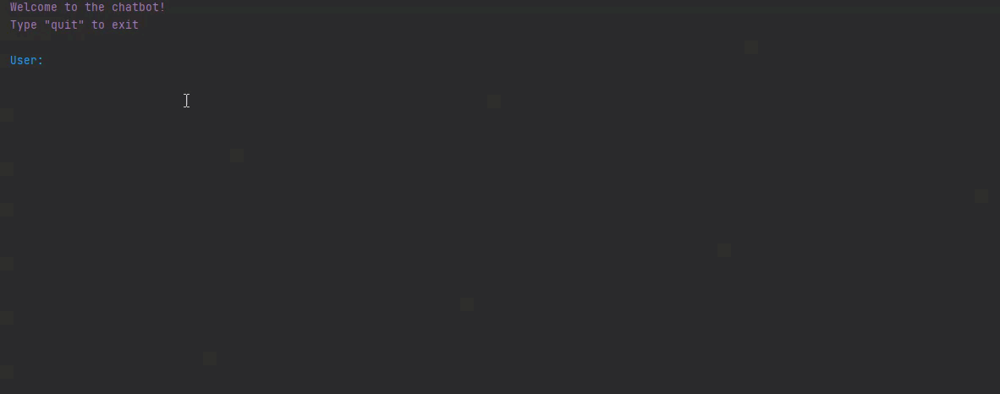

In [3]:
Image(open('Data/Chatbot.gif','rb').read(), height=700, width=700)
